In [9]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [52]:
import fastai
from fastai.vision import *
from fastai.metrics import *
from fastai.train import *

In [192]:
from fastai.imports import nn

In [58]:
SIZE = 224
PATH = "/mnt/data/group07/johannes/pol-pics/output/"
data = ImageDataBunch.from_folder(PATH, ds_tfms=get_transforms(do_flip=False), tfms=imagenet_norm, size=SIZE)

In [12]:
learner = ConvLearner(data, tvm.resnet50, metrics=[accuracy], callback_fns=ShowGraph)

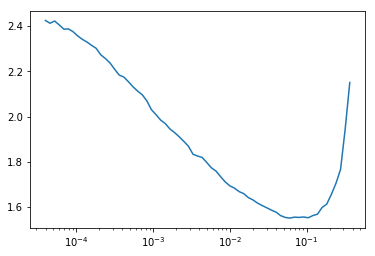

In [13]:
# find optimal LR
learner.lr_find()
learner.recorder.plot()

/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


Total time: 03:18
epoch  train loss  valid loss  accuracy
0      0.791951    0.777322    0.742143  (01:39)
1      0.550582    0.542458    0.820000  (01:38)



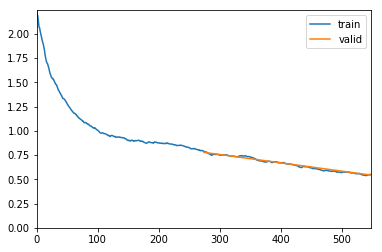

In [14]:
learner.fit_one_cycle(2, 1e-2)

In [15]:
learner.freeze_to(-3)

/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


Total time: 22:15
epoch  train loss  valid loss  accuracy
0      0.479554    0.539098    0.820714  (01:51)
1      0.480767    0.537273    0.825000  (01:50)
2      0.493753    0.535853    0.830000  (01:50)
3      0.468334    0.526904    0.826429  (01:50)
4      0.443621    0.532177    0.819286  (01:51)
5      0.431405    0.527682    0.825000  (01:51)
6      0.437975    0.524323    0.828571  (01:51)
7      0.411216    0.523190    0.827857  (01:51)
8      0.426360    0.523989    0.828571  (01:51)
9      0.430025    0.523266    0.825714  (01:51)
10     0.424913    0.520127    0.830000  (01:51)
11     0.420989    0.523199    0.829286  (01:52)



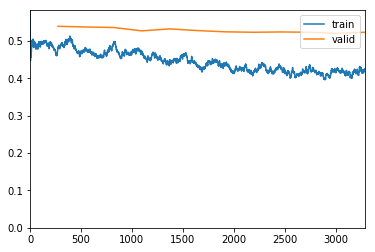

In [16]:
learner.fit_one_cycle(12, slice(1e-7,1e-5))

In [17]:
learner.save(PATH + '/model')

In [18]:
preds, y = learner.TTA()
interp = ClassificationInterpretation(data, preds, y)

/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/group7/anaconda3/envs/fv1/lib/python3.6/site-packages/PIL/Image.py:953: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


Total time: 01:21



In [177]:
accuracy(preds, y).item()

0.8357142806053162

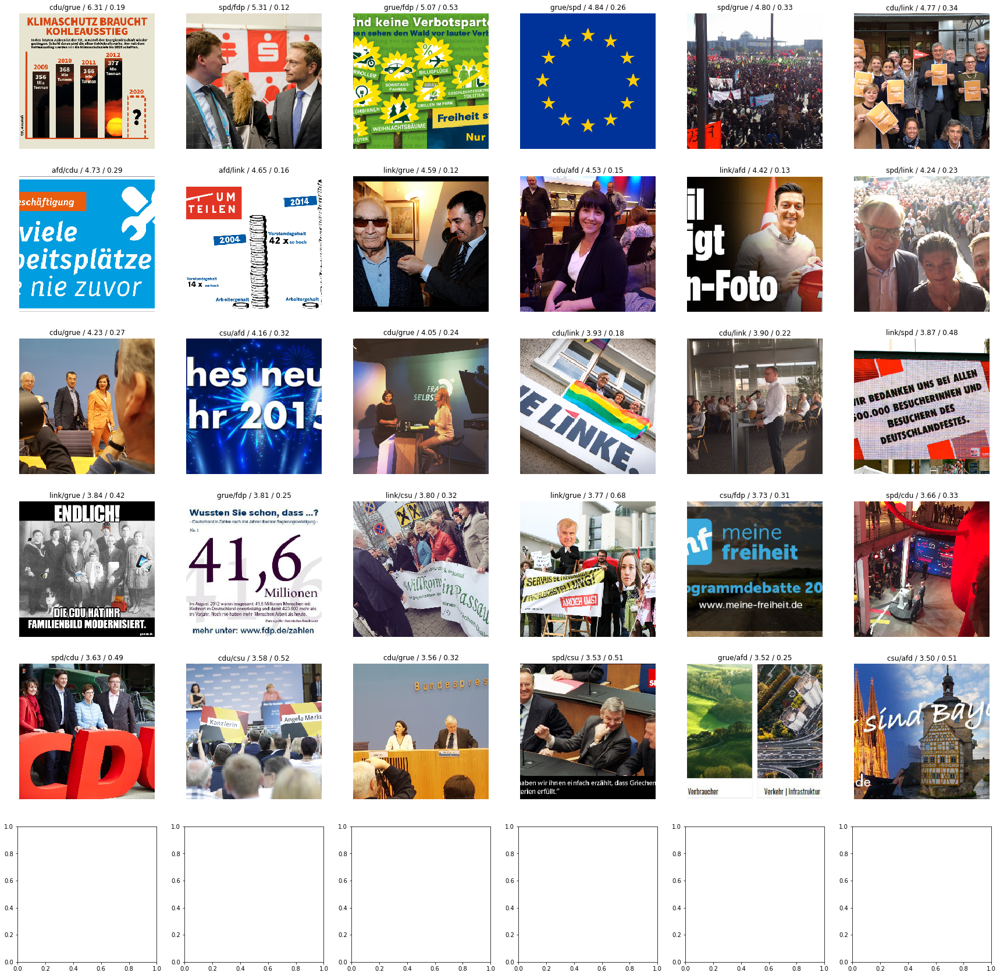

In [20]:
interp.plot_top_losses(30, figsize=(30,30))

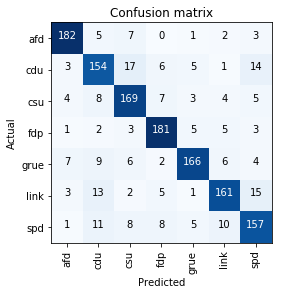

In [21]:
interp.plot_confusion_matrix()

In [194]:
x_distribution = nn.functional.softmax(preds, dim=1)
cls = data.valid_ds.ds.classes

In [153]:
def most_uncertain(dist, num, fil=None, certain=False):
    tmp = [(index, max(val), val.tolist().index(max(val))) for index, val in enumerate(dist)]
    if not fil is None:
        tmp = [t for t in tmp if t[-1] == fil]
    sor = sorted(tmp, key=lambda x: x[1], reverse=certain)
    return sor[:num]

In [181]:
def plot(arr):
    imgs, titles = [], []

    for x in arr:
        imgs.append(data.valid_ds[x[0]][0])
        st = str(x[1].item())[:6] + ', predicted: ' + cls[x[-1]] + ', true: ' + cls[data.valid_ds[x[0]][-1]]
        titles.append(st)

    for i in range(len(imgs)):
        imgs[i].show(title=titles[i])

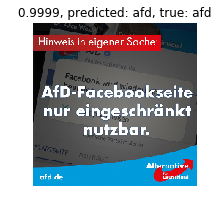

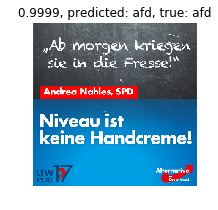

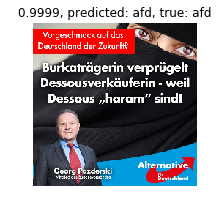

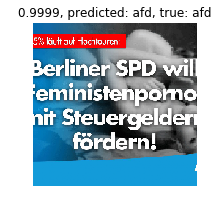

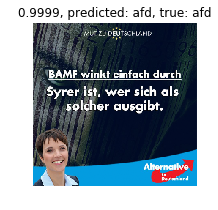

...

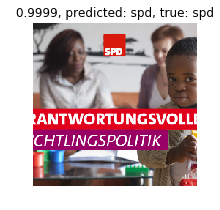

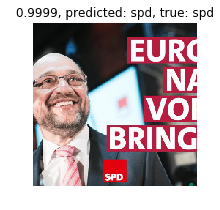

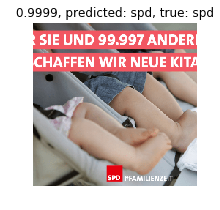

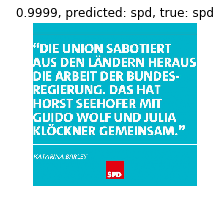

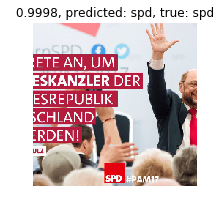

In [182]:
# Most Certain for each party
for index, class_name in enumerate(cls):
    plot(most_uncertain(x_distribution, 10, certain=True, fil=index))

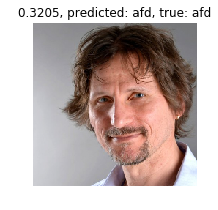

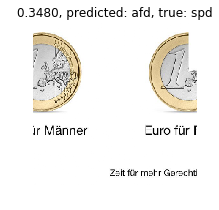

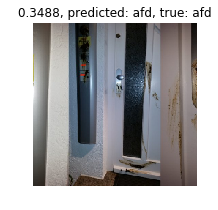

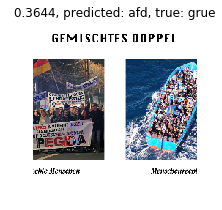

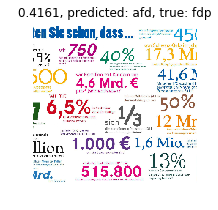

...

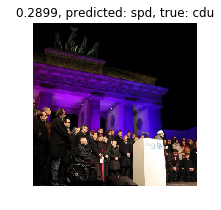

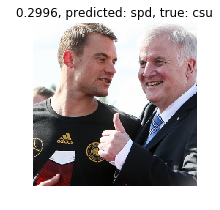

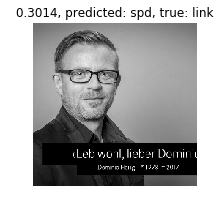

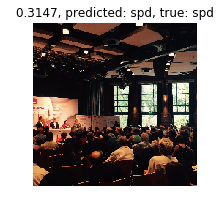

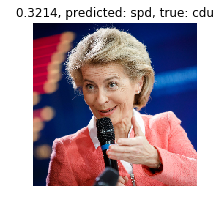

In [183]:
# Most Uncertain for each party
for index, class_name in enumerate(cls):
    plot(most_uncertain(x_distribution, 10, fil=index))